In [53]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load in 

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list the files in the input directory

import os
print(os.listdir("../input"))

# Any results you write to the current directory are saved as output.

['database.csv']


In [54]:
d = pd.read_csv('../input/database.csv')
d.head()

,Date,Time,Latitude,Longitude,Type,Depth,Depth Error,Depth Seismic Stations,Magnitude,Magnitude Type,Magnitude Error,Magnitude Seismic Stations,Azimuthal Gap,Horizontal Distance,Horizontal Error,Root Mean Square,ID,Source,Location Source,Magnitude Source,Status
0,01/02/1965,13:44:18,19.246,145.616,Earthquake,131.6,NaN,NaN,6.0,MW,NaN,NaN,NaN,NaN,NaN,NaN,ISCGEM860706,ISCGEM,ISCGEM,ISCGEM,Automatic
1,01/04/1965,11:29:49,1.863,127.352,Earthquake,80.0,NaN,NaN,5.8,MW,NaN,NaN,NaN,NaN,NaN,NaN,ISCGEM860737,ISCGEM,ISCGEM,ISCGEM,Automatic
2,01/05/1965,18:05:58,-20.579,-173.972,Earthquake,20.0,NaN,NaN,6.2,MW,NaN,NaN,NaN,NaN,NaN,NaN,ISCGEM860762,ISCGEM,ISCGEM,ISCGEM,Automatic
3,01/08/1965,18:49:43,-59.076,-23.557,Earthquake,15.0,NaN,NaN,5.8,MW,NaN,NaN,NaN,NaN,NaN,NaN,ISCGEM860856,ISCGEM,ISCGEM,ISCGEM,Automatic
4,01/09/1965,13:32:50,11.938,126.427,Earthquake,15.0,NaN,NaN,5.8,MW,NaN,NaN,NaN,NaN,NaN,NaN,ISCGEM860890,ISCGEM,ISCGEM,ISCGEM,Automatic


In [55]:
d['Type'].unique()

array(['Earthquake', 'Nuclear Explosion', 'Explosion', 'Rock Burst'],
      dtype=object)

In [56]:
d1 = d[d['Type']== 'Earthquake']
d1.head()

,Date,Time,Latitude,Longitude,Type,Depth,Depth Error,Depth Seismic Stations,Magnitude,Magnitude Type,Magnitude Error,Magnitude Seismic Stations,Azimuthal Gap,Horizontal Distance,Horizontal Error,Root Mean Square,ID,Source,Location Source,Magnitude Source,Status
0,01/02/1965,13:44:18,19.246,145.616,Earthquake,131.6,NaN,NaN,6.0,MW,NaN,NaN,NaN,NaN,NaN,NaN,ISCGEM860706,ISCGEM,ISCGEM,ISCGEM,Automatic
1,01/04/1965,11:29:49,1.863,127.352,Earthquake,80.0,NaN,NaN,5.8,MW,NaN,NaN,NaN,NaN,NaN,NaN,ISCGEM860737,ISCGEM,ISCGEM,ISCGEM,Automatic
2,01/05/1965,18:05:58,-20.579,-173.972,Earthquake,20.0,NaN,NaN,6.2,MW,NaN,NaN,NaN,NaN,NaN,NaN,ISCGEM860762,ISCGEM,ISCGEM,ISCGEM,Automatic
3,01/08/1965,18:49:43,-59.076,-23.557,Earthquake,15.0,NaN,NaN,5.8,MW,NaN,NaN,NaN,NaN,NaN,NaN,ISCGEM860856,ISCGEM,ISCGEM,ISCGEM,Automatic
4,01/09/1965,13:32:50,11.938,126.427,Earthquake,15.0,NaN,NaN,5.8,MW,NaN,NaN,NaN,NaN,NaN,NaN,ISCGEM860890,ISCGEM,ISCGEM,ISCGEM,Automatic


In [57]:
min(d1['Magnitude'])

5.5

In [58]:
max(d1['Magnitude'])

9.1

In [59]:
min(d1['Depth'])

-1.1

In [60]:
max(d1['Depth'])

700.0

In [61]:
d1['Status'].unique()

array(['Automatic', 'Reviewed'], dtype=object)

In [62]:
d1["Year"] = pd.to_datetime(d1['Date']).dt.year
d1.head()

/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



,Date,Time,Latitude,Longitude,Type,Depth,Depth Error,Depth Seismic Stations,Magnitude,Magnitude Type,Magnitude Error,Magnitude Seismic Stations,Azimuthal Gap,Horizontal Distance,Horizontal Error,Root Mean Square,ID,Source,Location Source,Magnitude Source,Status,Year
0,01/02/1965,13:44:18,19.246,145.616,Earthquake,131.6,NaN,NaN,6.0,MW,NaN,NaN,NaN,NaN,NaN,NaN,ISCGEM860706,ISCGEM,ISCGEM,ISCGEM,Automatic,1965
1,01/04/1965,11:29:49,1.863,127.352,Earthquake,80.0,NaN,NaN,5.8,MW,NaN,NaN,NaN,NaN,NaN,NaN,ISCGEM860737,ISCGEM,ISCGEM,ISCGEM,Automatic,1965
2,01/05/1965,18:05:58,-20.579,-173.972,Earthquake,20.0,NaN,NaN,6.2,MW,NaN,NaN,NaN,NaN,NaN,NaN,ISCGEM860762,ISCGEM,ISCGEM,ISCGEM,Automatic,1965
3,01/08/1965,18:49:43,-59.076,-23.557,Earthquake,15.0,NaN,NaN,5.8,MW,NaN,NaN,NaN,NaN,NaN,NaN,ISCGEM860856,ISCGEM,ISCGEM,ISCGEM,Automatic,1965
4,01/09/1965,13:32:50,11.938,126.427,Earthquake,15.0,NaN,NaN,5.8,MW,NaN,NaN,NaN,NaN,NaN,NaN,ISCGEM860890,ISCGEM,ISCGEM,ISCGEM,Automatic,1965


In [ ]:
print("Years from:", min(d1['Year']), " to:", max(d1['Year']))

In [ ]:
#print maximum occurance on location
l = max(d1['Latitude'])
l1 = max(d1['Longitude'])


In [ ]:
list(d1['Latitude']).index(l) 

In [ ]:
list(d1['Longitude']).index(l1)

In [ ]:
d1['RichterM'] = np.power(d1['Magnitude'], 10)

In [48]:
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline 
from bubbly.bubbly import bubbleplot 
from __future__ import division
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode()
IS_LOCAL = False
figure = bubbleplot(dataset=d1, x_column='Longitude', y_column='Latitude', color_column = 'Magnitude',
    bubble_column = 'Magnitude', time_column='Year', size_column = 'RichterM',
    x_title='Longitude', y_title='Latitude', 
    title='Earthquakes Ocurance position (long, lat) and magnitude - from 1965 to 2016', 
    colorscale='Rainbow', colorbar_title='Magnitude', 
    x_range=[-181,181], y_range=[-90,90], scale_bubble=0.5, height=650)
iplot(figure, config={'scrollzoom': True})

/opt/conda/lib/python3.6/site-packages/plotly/offline/offline.py:164: UserWarning:


Unrecognized config options supplied: ['scrollzoom']

/opt/conda/lib/python3.6/site-packages/plotly/offline/offline.py:164: UserWarning:


Unrecognized config options supplied: ['scrollzoom']



In [ ]:
!pip install bubbly

In [52]:
import reverse_geocoder as rg 
import pprint 
  
def reverseGeocode(coordinates): 
    result = rg.search(coordinates) 
      
    # result is a list containing ordered dictionary. 
    return result[0]['cc']
  


In [51]:
reverseGeocode((19.246, 145.616))

'MP'

In [ ]:
subset = d1[['Latitude', 'Longitude']]
tuples = [tuple(x) for x in subset.values]
d1['Country'] = [reverseGeocode(c) for c in tuples]

In [ ]:
d1.to_csv('resultFE.csv')

In [66]:
#maximum number of earthquack
d1 = pd.read_csv('resultFE.csv')
max(d1['Country'])

'ZW'

In [ ]:
len(set(d1['Country']))

NOW i'm ploting a bar graph to see that where maximum no. of earthquake came, i've ploted top ten country where acording to the number of earthquake 

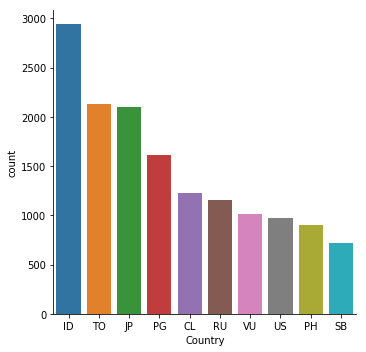

In [67]:
sns.catplot('Country', data= d1, kind= 'count', order=pd.value_counts(d1['Country']).iloc[:10].index)

From the above result , it is clear that Indonesia is the Country where maximum number of earthquake took place.

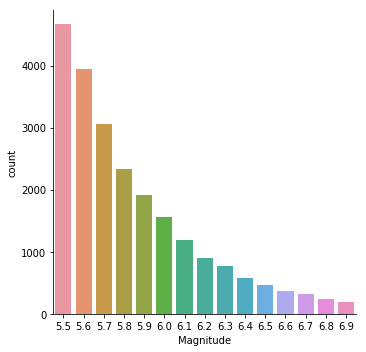

In [68]:
sns.catplot('Magnitude', data= d1, kind= 'count', order=pd.value_counts(d1['Magnitude']).iloc[:15].index)